In [1]:
import anndata
import scvelo as scv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import loompy
import scanpy as sc
import h5py
import scipy.sparse as sp
from scipy import sparse
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
import scrublet as scr
import scipy.io

In [2]:
scv.settings.figdir = "/blue/square.t/peter.huynh/outs/scvelo_output/figures/gene_expression/"
sc.settings.figdir = "/blue/square.t/peter.huynh/outs/scvelo_output/figures/gene_expression/"

In [3]:
gray_softorange_orangered = LinearSegmentedColormap.from_list(
    "gray_softorange_orangered", ["#D3D3D3", "#02500e", "#001203"]
)

In [4]:
scv.settings.verbosity = 3  
scv.settings.presenter_view = True 
scv.set_figure_params('scvelo') 

In [5]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [6]:
print(f"ScVelo version: {scv.__version__}")

ScVelo version: 0.3.3


In [7]:
m5_adata_copy = anndata.read_loom("/blue/square.t/peter.huynh/outs/velocyto_outputs/minus345_2_v5e_062522_forced6k_possorted_genome_CEA3D.loom")
m4_adata_copy = anndata.read_loom("/blue/square.t/peter.huynh/outs/velocyto_outputs/minus4_v5e_062522_forced6k_possorted_genome_bam_GWFTD.loom")
p5_1_adata_copy = anndata.read_loom("/blue/square.t/peter.huynh/outs/velocyto_outputs/plus345_1_v5e_062522_forced6k_possorted_genome_bam_RL5DI.loom")
p5_2_adata_copy = anndata.read_loom("/blue/square.t/peter.huynh/outs/velocyto_outputs/plus345_2_v5e_062522_forced6k_possorted_genome_bam_6EON9.loom")
p4_adata_copy = anndata.read_loom("/blue/square.t/peter.huynh/outs/velocyto_outputs/plus4_v5e_062522_forced6k_possorted_genome_bam_CRXMJ.loom")

KeyboardInterrupt: 

In [ ]:
m5_adata=m5_adata_copy.copy()
m4_adata=m4_adata_copy.copy()
p5_1_adata=p5_1_adata_copy.copy()
p5_2_adata=p5_2_adata_copy.copy()
p4_adata=p4_adata_copy.copy()

In [ ]:
m5_adata.obs["sample"] = "minus345"
m4_adata.obs["sample"] = "minus4"
p5_1_adata.obs["sample"] = "plus345_1"
p5_2_adata.obs["sample"] = "plus345_2"
p4_adata.obs["sample"] = "plus4"

In [ ]:
m5_adata.var_names_make_unique()
m4_adata.var_names_make_unique()
p5_1_adata.var_names_make_unique()
p5_2_adata.var_names_make_unique()
p4_adata.var_names_make_unique()

In [ ]:
f = h5py.File('/blue/square.t/peter.huynh/cellranger/cellranger_outs/cellranger_minus345_2_v5e_062522_forced6k/outs/minus345_filtered_feature_bc_matrix.h5', 'r')

barcodes = [b.decode() for b in f['matrix']['barcodes'][:]]
genes = [g.decode() for g in f['matrix']['features']['name'][:]] 

egfp_idx = genes.index("egfp") #a single number

data = f['matrix']['data'][:]
indices = f['matrix']['indices'][:]
indptr = f['matrix']['indptr'][:]
shape = f['matrix']['shape'][:]  
X = sparse.csc_matrix((data, indices, indptr), shape=shape)

egfp_vector = X[egfp_idx, :].toarray().flatten()#(row,column)

formatted_barcodes = ["minus345_2_v5e_062522_forced6k_possorted_genome_CEA3D:" + bc.replace("-1", "x") for bc in barcodes] 
egfp_series = pd.Series(egfp_vector, index=formatted_barcodes)
egfp_vector_aligned = egfp_series.reindex(m5_adata.obs_names).fillna(0).astype(int).values
egfp_var_idx = m5_adata.var_names.get_loc("egfp")
m5_adata.X = m5_adata.X.tolil()
m5_adata.X[:, egfp_var_idx] = egfp_vector_aligned.reshape(-1, 1)
m5_adata.X = m5_adata.X.tocsr()

In [ ]:
f = h5py.File('/blue/square.t/peter.huynh/cellranger/cellranger_outs/cellranger_minus4_v5e_062522_forced6k/outs/minus_4_filtered_feature_bc_matrix.h5', 'r')

barcodes = [b.decode() for b in f['matrix']['barcodes'][:]]
genes = [g.decode() for g in f['matrix']['features']['name'][:]] 

egfp_idx = genes.index("egfp") #a single number

data = f['matrix']['data'][:]
indices = f['matrix']['indices'][:]
indptr = f['matrix']['indptr'][:]
shape = f['matrix']['shape'][:]  
X = sparse.csc_matrix((data, indices, indptr), shape=shape)

egfp_vector = X[egfp_idx, :].toarray().flatten()#(row,column)
formatted_barcodes = ["minus4_v5e_062522_forced6k_possorted_genome_bam_GWFTD:" + bc.replace("-1", "x") for bc in barcodes] 
egfp_series = pd.Series(egfp_vector, index=formatted_barcodes)
egfp_vector_aligned = egfp_series.reindex(m4_adata.obs_names).fillna(0).astype(int).values
egfp_var_idx = m4_adata.var_names.get_loc("egfp")
m4_adata.X = m4_adata.X.tolil()
m4_adata.X[:, egfp_var_idx] = egfp_vector_aligned.reshape(-1, 1)
m4_adata.X = m4_adata.X.tocsr()

In [ ]:
f = h5py.File('/blue/square.t/peter.huynh/cellranger/cellranger_outs/cellranger_plus345_2_v5e_062522_forced6k/outs/filtered_feature_bc_matrix.h5', 'r')

barcodes = [b.decode() for b in f['matrix']['barcodes'][:]]
genes = [g.decode() for g in f['matrix']['features']['name'][:]] 

egfp_idx = genes.index("egfp") #a single number

data = f['matrix']['data'][:]
indices = f['matrix']['indices'][:]
indptr = f['matrix']['indptr'][:]
shape = f['matrix']['shape'][:]  
X = sparse.csc_matrix((data, indices, indptr), shape=shape)

egfp_vector = X[egfp_idx, :].toarray().flatten()#(row,column)
formatted_barcodes = ["plus345_2_v5e_062522_forced6k_possorted_genome_bam_6EON9:" + bc.replace("-1", "x") for bc in barcodes] 
egfp_series = pd.Series(egfp_vector, index=formatted_barcodes)
egfp_vector_aligned = egfp_series.reindex(p5_2_adata.obs_names).fillna(0).astype(int).values
egfp_var_idx = p5_2_adata.var_names.get_loc("egfp")
p5_2_adata.X = p5_2_adata.X.tolil()
p5_2_adata.X[:, egfp_var_idx] = egfp_vector_aligned.reshape(-1, 1)
p5_2_adata.X = p5_2_adata.X.tocsr()

In [ ]:
f = h5py.File('/blue/square.t/peter.huynh/cellranger/cellranger_outs/cellranger_plus345_1_v5e_062522_forced6k/outs/plus345_filtered_feature_bc_matrix.h5', 'r')

barcodes = [b.decode() for b in f['matrix']['barcodes'][:]]
genes = [g.decode() for g in f['matrix']['features']['name'][:]] 

egfp_idx = genes.index("egfp") #a single number

data = f['matrix']['data'][:]
indices = f['matrix']['indices'][:]
indptr = f['matrix']['indptr'][:]
shape = f['matrix']['shape'][:]  
X = sparse.csc_matrix((data, indices, indptr), shape=shape)

egfp_vector = X[egfp_idx, :].toarray().flatten()#(row,column)
formatted_barcodes = ["plus345_1_v5e_062522_forced6k_possorted_genome_bam_RL5DI:" + bc.replace("-1", "x") for bc in barcodes] 
egfp_series = pd.Series(egfp_vector, index=formatted_barcodes)
egfp_vector_aligned = egfp_series.reindex(p5_1_adata.obs_names).fillna(0).astype(int).values
egfp_var_idx = p5_1_adata.var_names.get_loc("egfp")
p5_1_adata.X = p5_1_adata.X.tolil()
p5_1_adata.X[:, egfp_var_idx] = egfp_vector_aligned.reshape(-1, 1)
p5_1_adata.X = p5_1_adata.X.tocsr()

In [ ]:
f = h5py.File('/blue/square.t/peter.huynh/cellranger/cellranger_outs/cellranger_plus4_v5e_062522_forced6k/outs/plus4_filtered_feature_bc_matrix.h5', 'r')

barcodes = [b.decode() for b in f['matrix']['barcodes'][:]]
genes = [g.decode() for g in f['matrix']['features']['name'][:]] 

egfp_idx = genes.index("egfp") #a single number

data = f['matrix']['data'][:]
indices = f['matrix']['indices'][:]
indptr = f['matrix']['indptr'][:]
shape = f['matrix']['shape'][:]  
X = sparse.csc_matrix((data, indices, indptr), shape=shape)

egfp_vector = X[egfp_idx, :].toarray().flatten()#(row,column)
formatted_barcodes = ["plus4_v5e_062522_forced6k_possorted_genome_bam_CRXMJ:" + bc.replace("-1", "x") for bc in barcodes] 
egfp_series = pd.Series(egfp_vector, index=formatted_barcodes)
egfp_vector_aligned = egfp_series.reindex(p4_adata.obs_names).fillna(0).astype(int).values
egfp_var_idx = p4_adata.var_names.get_loc("egfp")
p4_adata.X = p4_adata.X.tolil()
p4_adata.X[:, egfp_var_idx] = egfp_vector_aligned.reshape(-1, 1)
p4_adata.X = p4_adata.X.tocsr()

In [ ]:
##save point
m5_adata_egfp=m5_adata.copy()
m4_adata_egfp=m4_adata.copy()
p5_1_adata_egfp=p5_1_adata.copy()
p5_2_adata_egfp=p5_2_adata.copy()
p4_adata_egfp=p4_adata.copy()

In [ ]:
adatas = {
    'm5': m5_adata_egfp,
    'm4': m4_adata_egfp,
    'p5_1': p5_1_adata_egfp,
    'p5_2': p5_2_adata_egfp,
    'p4': p4_adata_egfp
}

for name, adata in adatas.items():
    adata.var_names_make_unique()
    sc.pp.calculate_qc_metrics(adata, inplace=True)

In [ ]:

for name, adata in adatas.items():
    counts_cutoff = np.percentile(adata.obs['total_counts'], 99)
    genes_cutoff = np.percentile(adata.obs['n_genes_by_counts'], 99)

    adata_qc = adata[
        (adata.obs['total_counts'] < counts_cutoff) & 
        (adata.obs['n_genes_by_counts'] < genes_cutoff)
    ]

    for feature in ['n_genes_by_counts', 'total_counts']:
        sc.pl.violin(
            adata_qc,
            feature,
            jitter=0.4,
            show=False
        )
        plt.title(f"{name} {feature} (99th Percentile)")
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()

        sc.pl.scatter(
        adata,
        x='total_counts',
        y='n_genes_by_counts',
        show=True,
        title=f"{name} QC Scatter"
    )

In [ ]:
sc.pp.filter_cells(m5_adata_egfp, min_genes=1000)
sc.pp.filter_cells(m5_adata_egfp, max_genes=5000)
m5_adata_egfp = m5_adata_egfp[m5_adata_egfp.obs['total_counts'] < 25000, :] #(Number of UMI per cell)
m5_adata_egfp = m5_adata_egfp[m5_adata_egfp.obs['total_counts'] > 2500, :] #(Number of UMI per cell)

sc.pp.filter_genes(m5_adata_egfp, min_cells=3)

sc.pp.filter_cells(m4_adata_egfp, min_genes=1000)
sc.pp.filter_cells(m4_adata_egfp, max_genes=5000)
m4_adata_egfp = m4_adata_egfp[m4_adata_egfp.obs['total_counts'] < 25000, :] #(Number of UMI per cell)
m4_adata_egfp = m4_adata_egfp[m4_adata_egfp.obs['total_counts'] > 1000, :] #(Number of UMI per cell)
sc.pp.filter_genes(m4_adata_egfp, min_cells=3)

sc.pp.filter_cells(p5_1_adata_egfp, min_genes=750)
sc.pp.filter_cells(p5_1_adata_egfp, max_genes=5000)
p5_1_adata_egfp = p5_1_adata_egfp[p5_1_adata_egfp.obs['total_counts'] < 25000, :] #(Number of UMI per cell)
p5_1_adata_egfp = p5_1_adata_egfp[p5_1_adata_egfp.obs['total_counts'] > 1000, :] #(Number of UMI per cell)
sc.pp.filter_genes(p5_1_adata_egfp, min_cells=3)

sc.pp.filter_cells(p5_2_adata_egfp, min_genes=1000)
sc.pp.filter_cells(p5_2_adata_egfp, max_genes=5000)
p5_2_adata_egfp = p5_2_adata_egfp[p5_2_adata_egfp.obs['total_counts'] < 30000, :] #(Number of UMI per cell)
p5_2_adata_egfp = p5_2_adata_egfp[p5_2_adata_egfp.obs['total_counts'] > 1000, :] #(Number of UMI per cell)
sc.pp.filter_genes(p5_2_adata_egfp, min_cells=3)

sc.pp.filter_cells(p4_adata_egfp, min_genes=1000)
sc.pp.filter_cells(p4_adata_egfp, max_genes=5000)
p4_adata_egfp = p4_adata_egfp[p4_adata_egfp.obs['total_counts'] < 30000, :] #(Number of UMI per cell)
p4_adata_egfp = p4_adata_egfp[p4_adata_egfp.obs['total_counts'] > 1000, :] #(Number of UMI per cell)
sc.pp.filter_genes(p4_adata_egfp, min_cells=3)

In [ ]:
expected_rates = [0.04, 0.06, 0.08, 0.10]
methods = ['zscore', 'log']

for name, adata in adatas.items():
    counts_matrix = adata.X.copy()
    if not isinstance(counts_matrix, np.ndarray):
        counts_matrix = counts_matrix.toarray()

    for expected_rate in expected_rates:
        for method in methods:
            if method == 'zscore':
                scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=expected_rate)
                doublet_scores, predicted_doublets = scrub.scrub_doublets(
                    n_prin_comps=30,
                    mean_center=True,
                    normalize_variance=True,
                    log_transform=False
                )
                title = f"{name} | z-score | Expected Rate: {expected_rate}"

            elif method == 'log':
                scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=expected_rate)
                doublet_scores, predicted_doublets = scrub.scrub_doublets(
                    n_prin_comps=30,
                    mean_center=False,
                    normalize_variance=False,
                    log_transform=True
                )
                title = f"{name} | log-transform | Expected Rate: {expected_rate}"

            # Show histogram for inspection
            plt.figure()
            scrub.plot_histogram()
            plt.title(title)
            plt.show()
            plt.close()

In [ ]:
scrublet_params = {
    'm5': {'expected_rate': 0.06, 'log_transform': True, 'threshold': 0.2},
    'p5_1': {'expected_rate': 0.06, 'log_transform': False,  'threshold': 0.6},
    'p5_2': {'expected_rate': 0.06, 'log_transform': True, 'threshold': 0.25},
    'm4': {'expected_rate': 0.08, 'log_transform': True,  'threshold': 0.2},
    'p4': {'expected_rate': 0.06, 'log_transform': True, 'threshold': 0.2}
}

In [ ]:
adatas_clean = {}

for name, adata in adatas.items():
    params = scrublet_params[name]
    
    counts_matrix = adata.X.copy()
    if not isinstance(counts_matrix, np.ndarray):
        counts_matrix = counts_matrix.toarray()
    
    scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=params['expected_rate'])
    
    doublet_scores, predicted_doublets = scrub.scrub_doublets(
        n_prin_comps=30,
        mean_center=not params['log_transform'],
        normalize_variance=not params['log_transform'],
        log_transform=params['log_transform']
    )
    
    scrub.call_doublets(threshold=params['threshold'])
    
    adata.obs['doublet_score'] = scrub.doublet_scores_obs_
    adata.obs['predicted_doublet'] = scrub.predicted_doublets_
    
    adatas_clean[name] = adata[adata.obs['predicted_doublet'] == False].copy()

In [44]:
for name, adata in adatas.items():
    print(f"{name}: {adata.shape}")

m5: (5927, 28419)
m4: (5887, 28419)
p5_1: (5913, 28419)
p5_2: (5862, 28419)
p4: (5904, 28419)


In [43]:
for name, adata in adatas_clean.items():
    print(f"{name}: {adata.shape}")

m5: (5686, 28419)
m4: (5513, 28419)
p5_1: (5913, 28419)
p5_2: (5694, 28419)
p4: (5624, 28419)


In [41]:
for name, adata in adatas.items():
    print(f"{name} .X min: {adata.X.min()}, max: {adata.X.max()}")

m5 .X min: 0.0, max: 5665.0
m4 .X min: 0.0, max: 4247.0
p5_1 .X min: 0.0, max: 7985.0
p5_2 .X min: 0.0, max: 7544.0
p4 .X min: 0.0, max: 5863.0


In [42]:
for name, adata in adatas_clean.items():
    print(f"{name} .X min: {adata.X.min()}, max: {adata.X.max()}")

m5 .X min: 0.0, max: 5665.0
m4 .X min: 0.0, max: 4247.0
p5_1 .X min: 0.0, max: 7985.0
p5_2 .X min: 0.0, max: 7544.0
p4 .X min: 0.0, max: 5863.0


In [21]:
adata_combined = anndata.concat(
    adatas_clean.values(),
    label="sample",
    keys=adatas_clean.keys()
)

In [22]:
adata=adata_combined.copy()
adata.var_names_make_unique()

In [23]:
adata_raw = adata.copy() 

In [24]:
adata_transformed = adata.copy() 

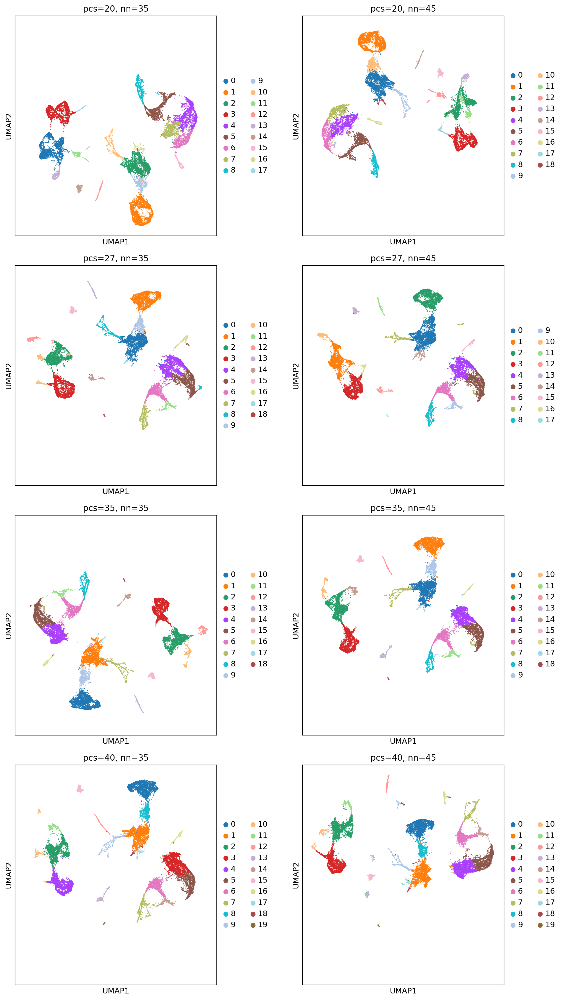

In [26]:
#n_pcs_list = [15,17,25,30]
n_pcs_list = [20,27,35,40]
#n_neighbors_list = [15,25]
n_neighbors_list = [35,45]
adata_transformed = adata.copy() 
sc.pp.normalize_total(adata_transformed, target_sum=1e4) 
sc.pp.log1p(adata_transformed)
sc.tl.pca(adata_transformed, n_comps=50)

n_rows = len(n_pcs_list)
n_cols = len(n_neighbors_list)


fig_width = n_cols * 6
fig_height = n_rows * 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)


point_size = max(10, 60 - 5 * max(n_rows, n_cols))

for row, n_pcs in enumerate(n_pcs_list):
    for col, n_neighbors in enumerate(n_neighbors_list):
        ax = axes[row, col]
        adata_temp = adata_transformed.copy()
        sc.pp.neighbors(adata_temp, n_neighbors=n_neighbors, n_pcs=n_pcs)
        sc.tl.umap(adata_temp, min_dist=0.1, spread=1.2)
        sc.tl.leiden(adata_temp,resolution=0.5)
        
        sc.pl.umap(
            adata_temp,
            color="leiden",
            title=f"pcs={n_pcs}, nn={n_neighbors}",
            cmap="viridis",
            ax=ax,
            show=False)
        
for ax in axes.flat:
    ax.set_aspect("equal")

plt.tight_layout()
plt.show()

In [ ]:
min_dist_list = [0.05,0.01,0.5]
#min_dist_list = [0.005,0.001,0.0005]
spread_list = [1,1.2,1.5]
#spread_list = [1.8,2,2.2]
adata_transformed = adata.copy() 
sc.pp.normalize_total(adata_transformed, target_sum=1e4) 
sc.pp.log1p(adata_transformed)
sc.tl.pca(adata_transformed, n_comps=50)


n_rows = len(min_dist_list)
n_cols = len(spread_list)

fig_width = n_cols * 6
fig_height = n_rows * 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)

point_size = max(10, 60 - 5 * max(n_rows, n_cols))

for row, min_dist in enumerate(min_dist_list):
    for col, spread in enumerate(spread_list):
        ax = axes[row, col]
        adata_temp = adata_transformed.copy()
        

        sc.tl.pca(adata_temp, n_comps=50)        
        sc.pp.neighbors(adata_temp, n_pcs=15,n_neighbors=35)
        sc.tl.umap(adata_temp, min_dist=min_dist, spread=spread)
        sc.tl.leiden(adata_temp,resolution=0.5)
        
        sc.pl.umap(
            adata_temp,
            color="leiden",
            title=f"(15,30) min_dist={min_dist}, spread={spread}",
            cmap="viridis",
            ax=ax,
            show=False,
            size=point_size
        )

for ax in axes.flat:
    ax.set_aspect("equal")

plt.tight_layout()
plt.show()

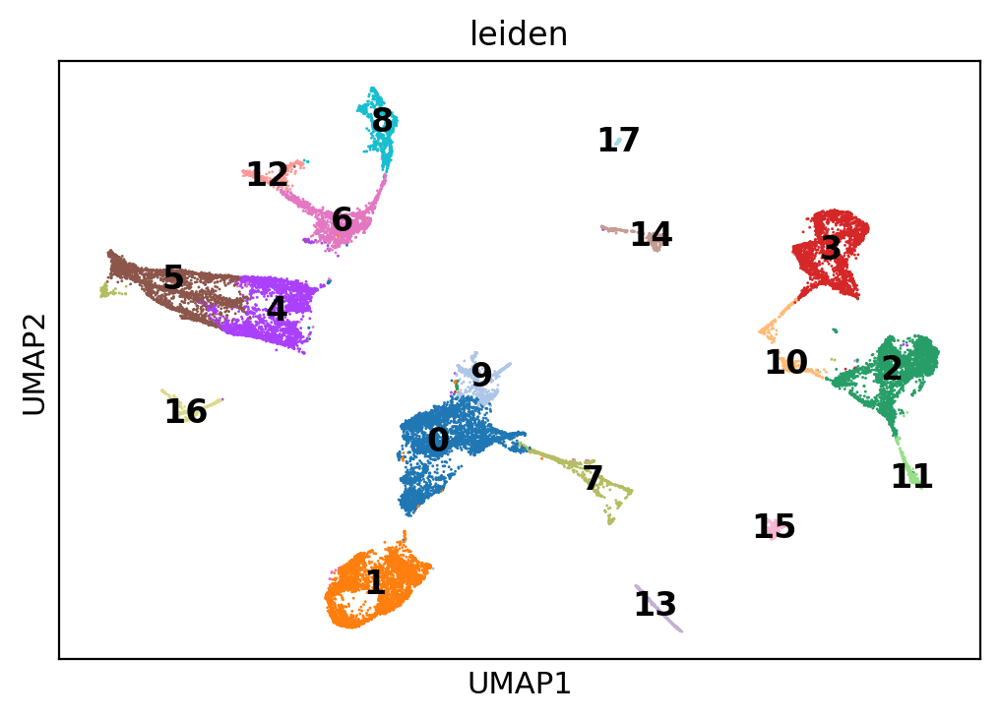

In [25]:
adata_transformed = adata.copy() 
sc.pp.normalize_total(adata_transformed, target_sum=1e4) 
sc.pp.log1p(adata_transformed)
sc.tl.pca(adata_transformed, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(adata_transformed, n_pcs=27, n_neighbors=25)
sc.tl.umap(adata_transformed,min_dist=0.005, spread=1)
sc.tl.leiden(adata_transformed,resolution=0.5)
sc.pl.umap(adata_transformed,color="leiden",cmap="viridis",
          legend_loc="on data")

In [ ]:
sample='minus4'
adata_sample = adata_transformed[adata_transformed.obs["sample"] == f"{sample}"].copy()

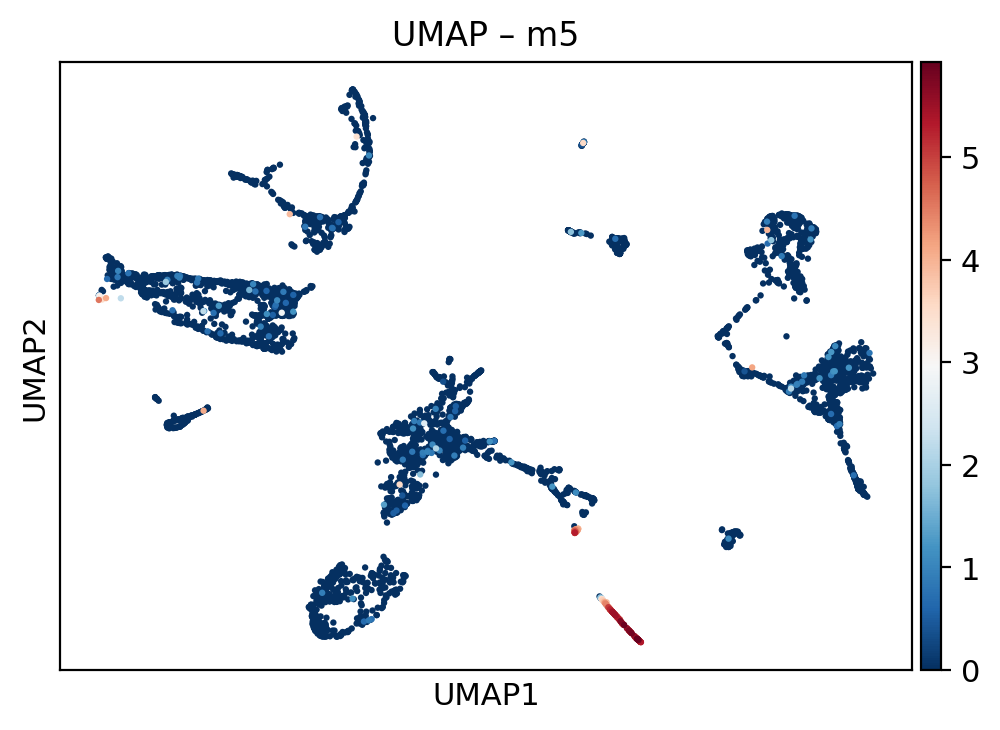

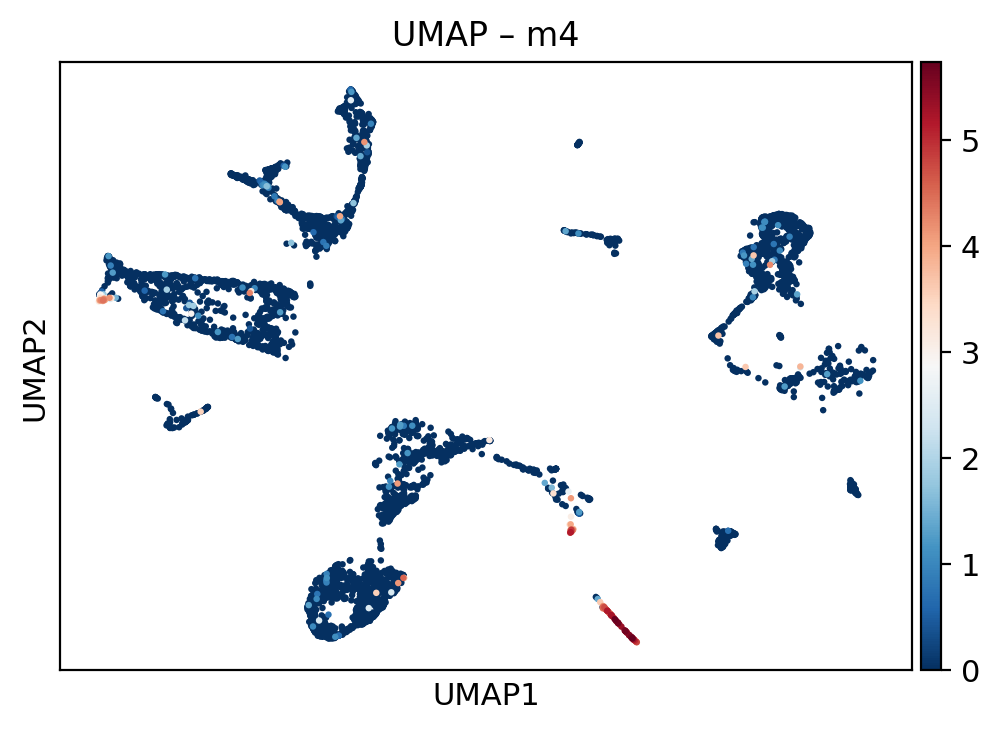

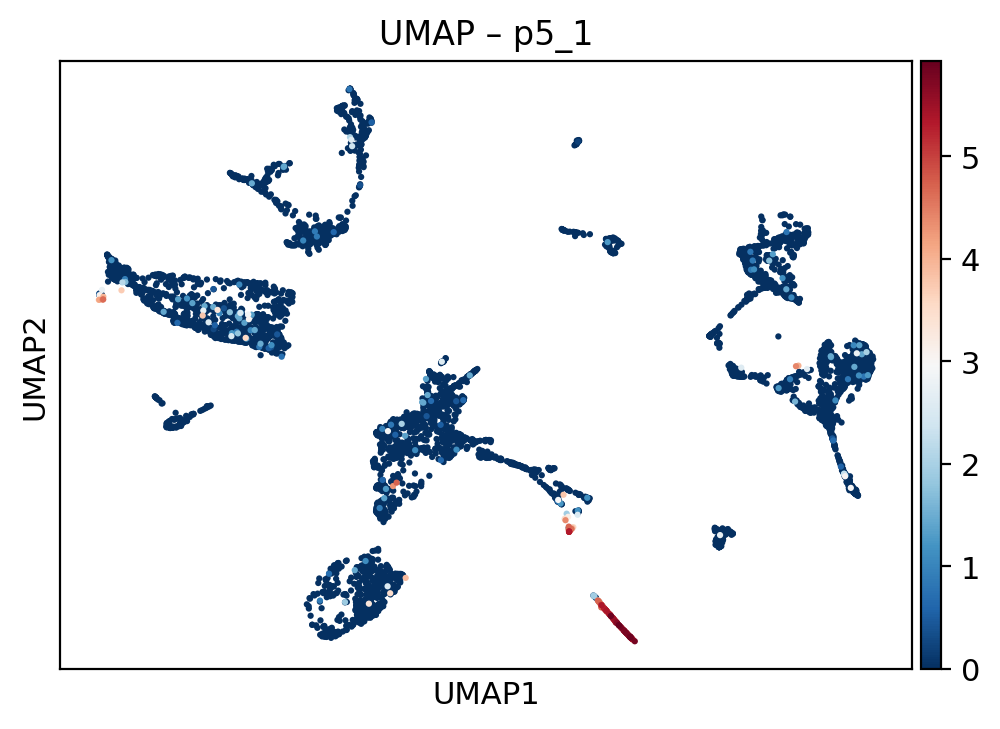

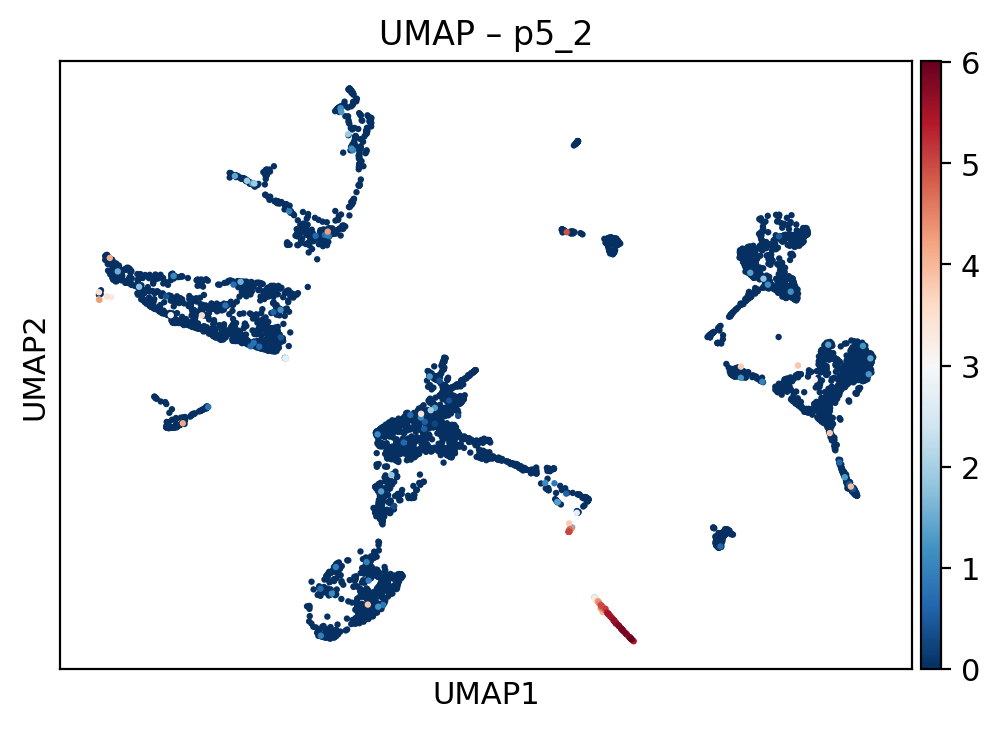

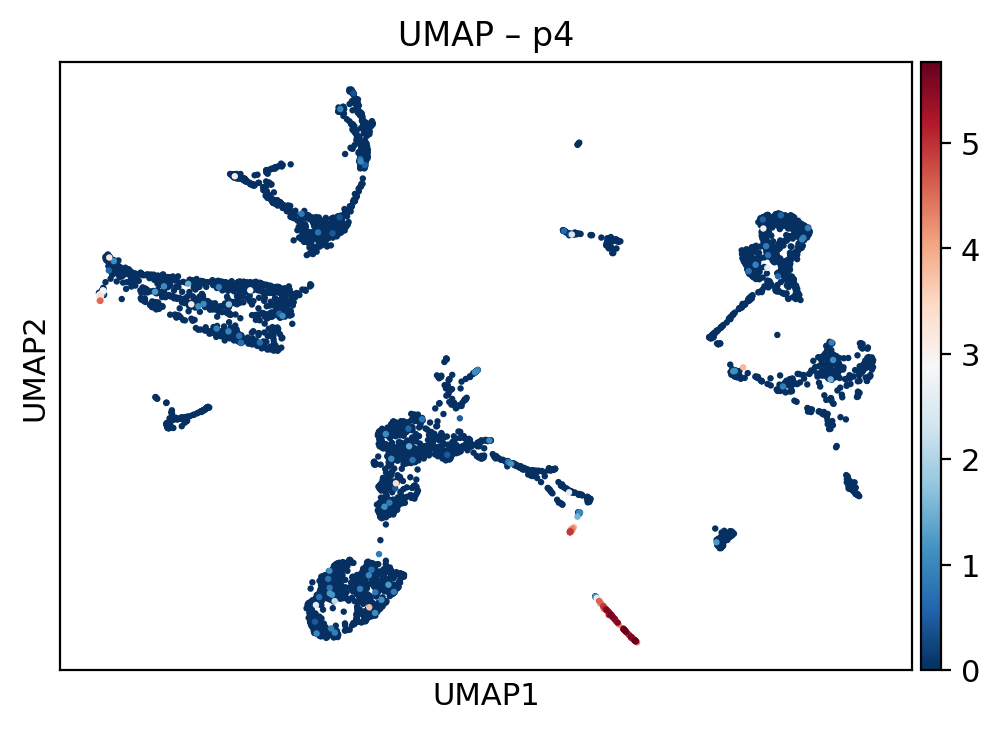

In [26]:
gene="calb2a"
for sample in adata_transformed.obs["sample"].unique():
    sc.pl.umap(
        adata_transformed[adata_transformed.obs["sample"] == sample],
        color=gene,
        title=f"UMAP – {sample}",
        show=True
    )

In [ ]:
for sample in adata_transformed.obs["sample"].unique():
    sc.pl.umap(
        adata_transformed[adata_transformed.obs["sample"] == sample],
        color="leiden",
        title=f"UMAP – {sample}",
        show=True
    )

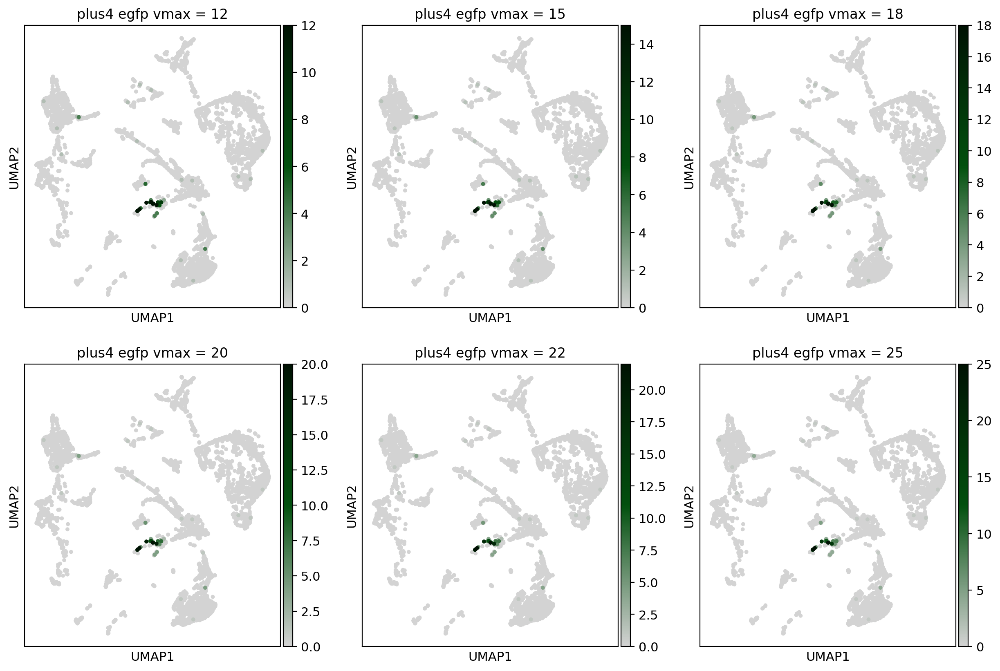

In [38]:
sample='plus4'
adata_sample = adata_transformed[adata_transformed.obs["sample"] == f"{sample}"].copy()

vmax_values = [12,15,18,20,22,25]
#vmax_values = [2,5,8,10,12,6]

ncols = 3
nrows = (len(vmax_values) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 5 * nrows))

axes = axes.flatten()

for i, vmax in enumerate(vmax_values):
    ax = axes[i]
    sc.pl.umap(
        adata_sample,
        color="egfp",
        vmin=0,
        vmax=vmax,
        size=50,
        title=f"{sample} egfp vmax = {vmax}",
        cmap=gray_softorange_orangered,
        show=False,
        ax=ax  
    )

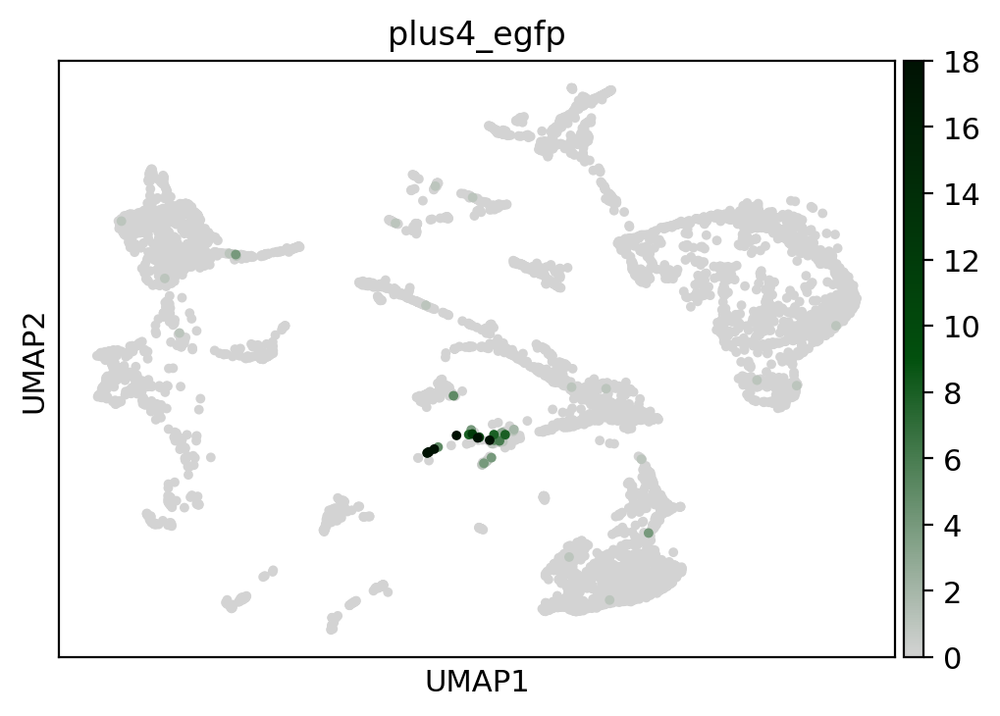

In [39]:
sample='plus4'
gene='egfp'
adata_sample = adata_transformed[adata_transformed.obs["sample"] == f"{sample}"].copy()
sc.pl.umap(
    adata_sample,
    color=gene,
    vmin=0,
    vmax=18,
    size=50,
    title=f'{sample}_{gene}',
    cmap=gray_softorange_orangered,
    save=f"_full_umap_{sample}_{gene}.pdf"
)

In [42]:
barcodes = pd.read_csv("/blue/square.t/peter.huynh/outs/scvelo_output/epi_interest.csv")["Barcode"].tolist()
sample_number_to_prefix_and_sample = {
    "1": ("plus4_v5e_062522_forced6k_possorted_genome_bam_CRXMJ", "plus4"),
    "2": ("plus345_1_v5e_062522_forced6k_possorted_genome_bam_RL5DI", "plus345_1"),
    "3": ("plus345_2_v5e_062522_forced6k_possorted_genome_bam_6EON9", "plus345_2"),
    "4": ("minus4_v5e_062522_forced6k_possorted_genome_bam_GWFTD", "minus4"),
    "5": ("minus345_2_v5e_062522_forced6k_possorted_genome_CEA3D", "minus345")
}

def convert_barcode(bc):
    barcode_part, sample_number = bc.split("-")
    prefix, sample = sample_number_to_prefix_and_sample[sample_number]
    return f"{prefix}:{barcode_part}x-{sample}"

barcodes_full = pd.Series(barcodes).apply(convert_barcode).tolist()
adata_filtered = adata_transformed[adata_transformed.obs_names.isin(barcodes_full)].copy()

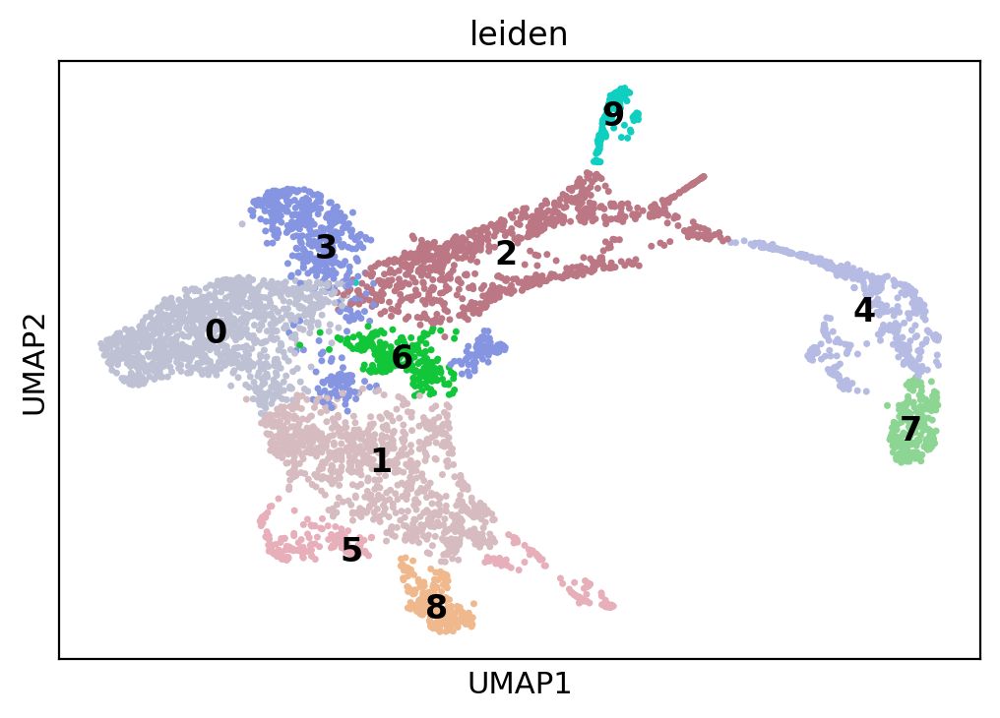

In [44]:
adata_subset = adata_filtered.copy()
sc.tl.pca(adata_subset, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(adata_subset, n_pcs=15, n_neighbors=15)  
sc.tl.umap(adata_subset,min_dist=0.3, spread=1.2)
sc.tl.leiden(adata_subset, resolution=0.3)
sc.pl.umap(adata_subset, color="leiden", cmap="viridis",legend_loc="on data")

In [67]:
adata_subset=sc.read_h5ad("/blue/square.t/peter.huynh/outs/scvelo_output/adata_subset_cbd_pc40_n15_full.h5ad")

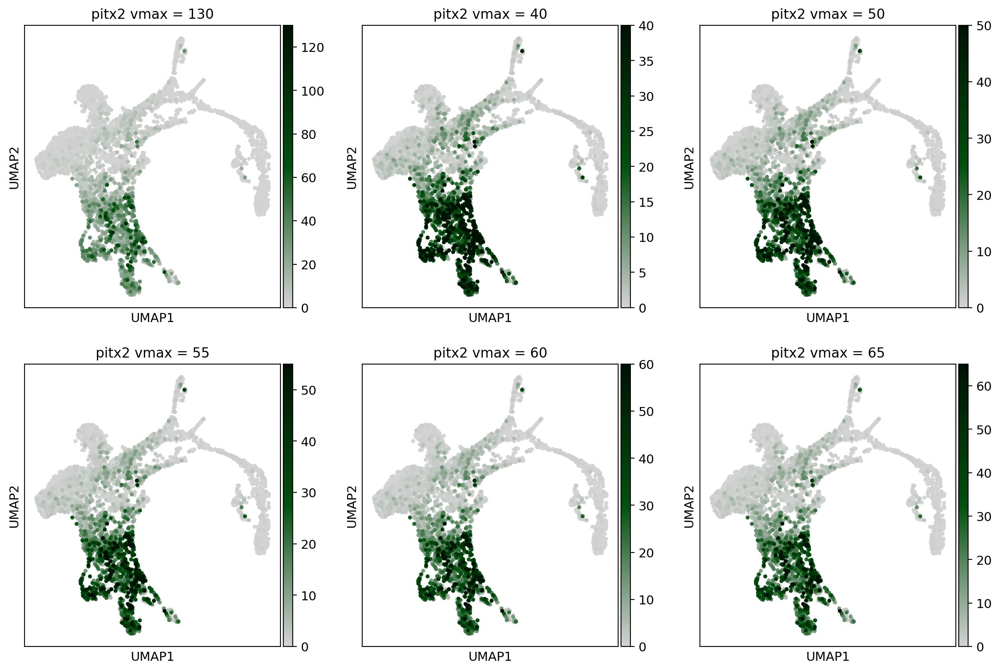

In [52]:
vmax_values = [130,40,50,55,60,65]
#vmax_values = [12,15,18,20,22,25]
#vmax_values = [2,5,8,10,12,6]
gene="pitx2"
ncols = 3
nrows = (len(vmax_values) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 5 * nrows))

axes = axes.flatten()

for i, vmax in enumerate(vmax_values):
    ax = axes[i]
    sc.pl.umap(
        adata_subset,
        color=gene,
        vmin=0,
        vmax=vmax,
        size=50,
        title=f"{gene} vmax = {vmax}",
        cmap=gray_softorange_orangered,
        show=False,
        ax=ax  
    )

/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(values):


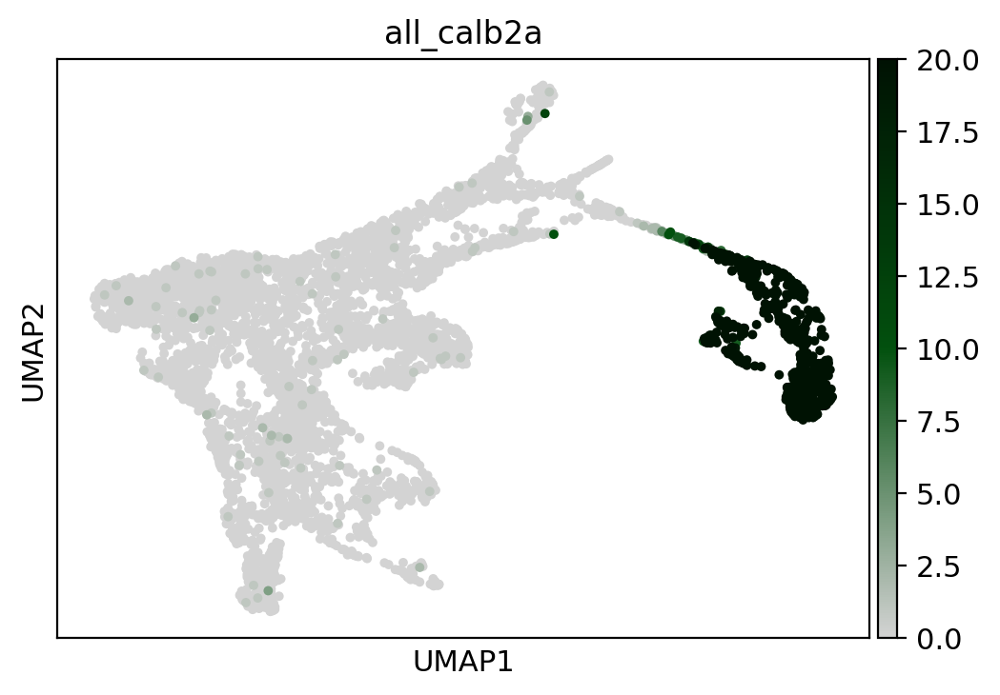

In [70]:
adata_sample = adata_subset.copy() #[adata_subset.obs["sample"] == "minus345"]
sample='all'
gene='calb2a'
sc.pl.umap(
    adata_sample,
    color=gene,
    vmin=0,
    vmax=20,
    size=50,
    title=f'{sample}_{gene}',
    cmap=gray_softorange_orangered,
    save=f"_{sample}_subset_{gene}.pdf"
)

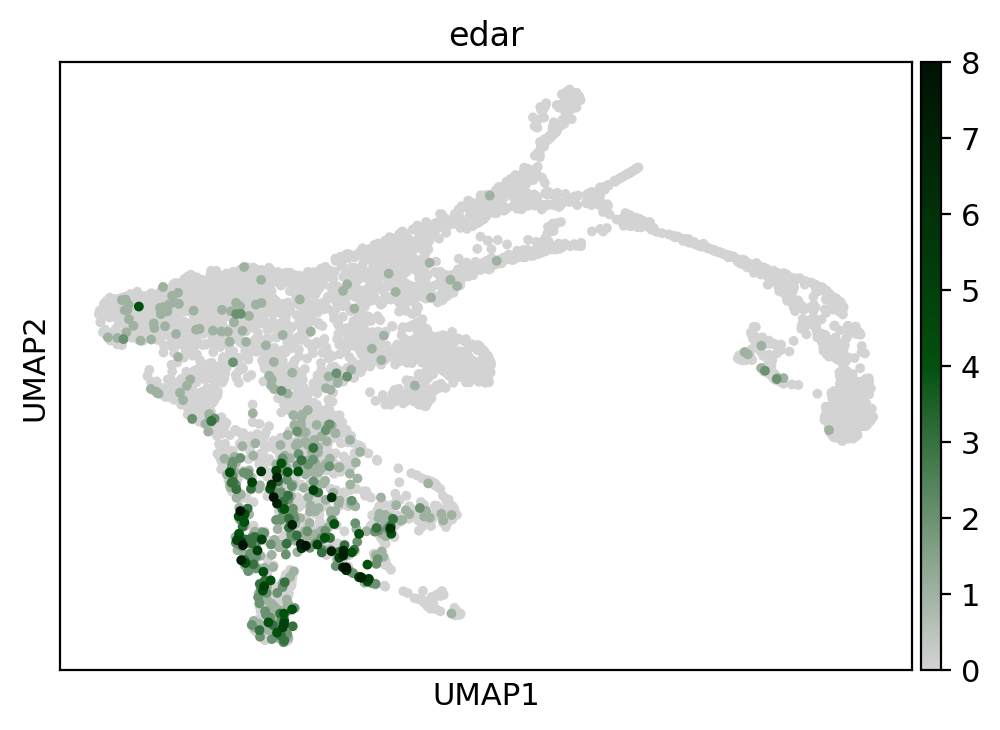

In [139]:
sc.pl.umap(
    adata_subset,
    color="edar",
    vmin=0,
    vmax=8,
    size=50,
    title='edar',
    cmap=gray_softorange_orangered,
    save="subset_umap_edar.pdf"
)

In [53]:
gray_softorange_orangered = LinearSegmentedColormap.from_list(
    "gray_softorange_orangered", ["#D3D3D3", "#02500e", "#001203"]
)

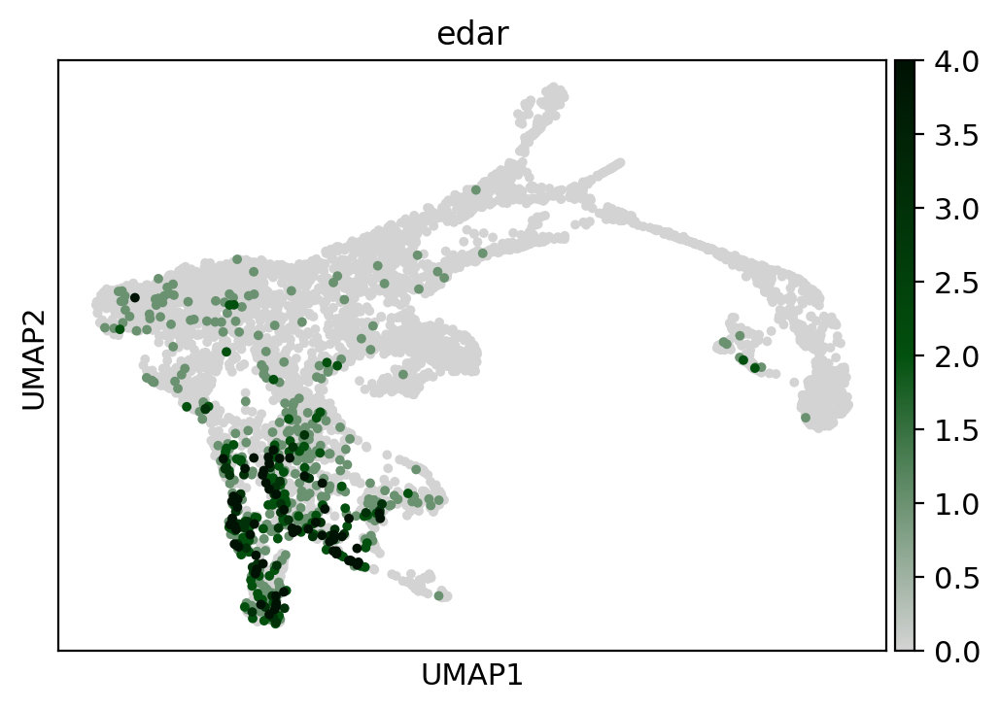

In [74]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap

gray_softorange_orangered = LinearSegmentedColormap.from_list(
    "gray_softorange_orangered", ["#D3D3D3", "#02500e", "#001203"]
)

sc.settings.figdir = "/blue/square.t/peter.huynh/outs/scvelo_output"
sc.pl.umap(
    adata_subset,
    color="edar",
    vmin=0,
    vmax=4,
    size=50,
    cmap=gray_softorange_orangered,
    save="_my_umap.pdf"
)

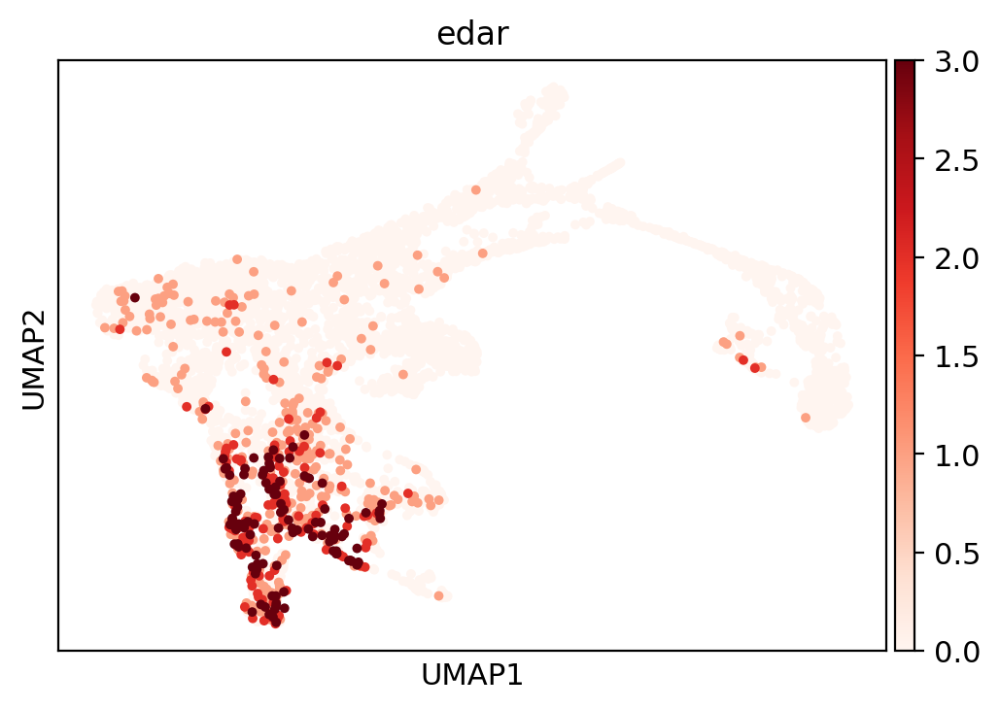

In [48]:
sc.pl.umap(
    adata_subset,
    color="edar",
    vmin=0,
    vmax=3,
    size=50,
    cmap='Reds'
)


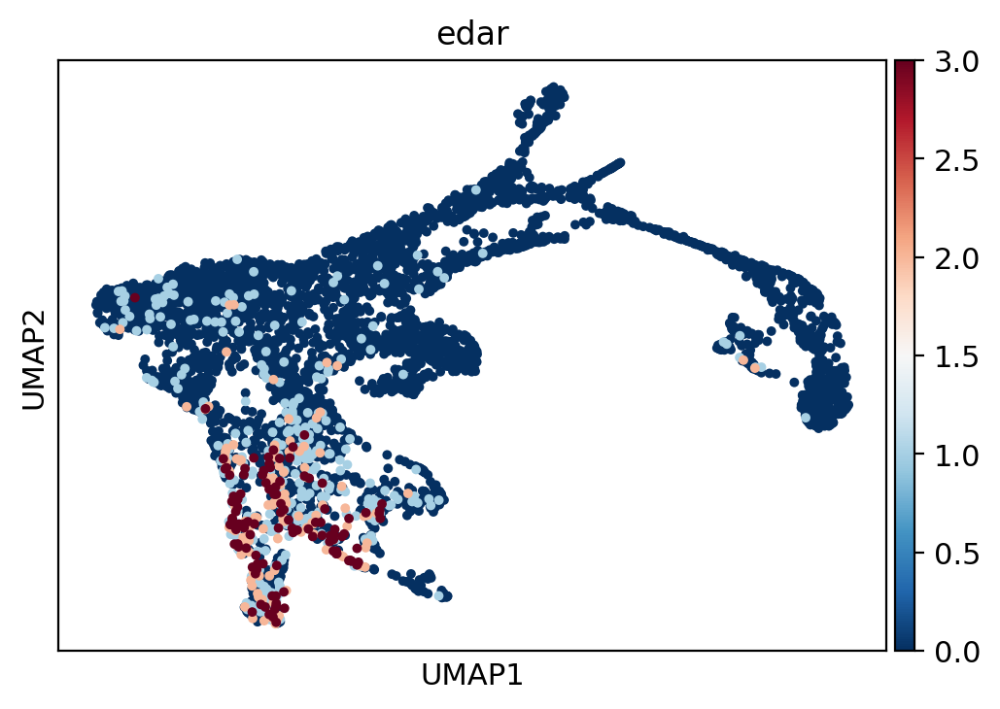

In [47]:
sc.pl.umap(
    adata_subset,
    color="edar",
    vmin=0,
    vmax=3,
    size=50)

In [62]:
adata_raw = adata.copy() 
adata_raw = adata_raw[adata_subset.obs_names].copy()
adata_raw.obsm["X_umap"] = adata_subset.obsm["X_umap"]
adata_raw.obs["leiden"] = adata_subset.obs["leiden"]

In [63]:
#adata_raw=adata_subset.copy()

In [64]:
scv.pp.filter_and_normalize(
    adata_raw,
    min_counts=20,
    min_cells=5,
    n_top_genes=None, 
    log=True  
)
scv.pp.moments(adata_raw, n_pcs=35, n_neighbors=45)
scv.tl.velocity(adata_raw, mode="stochastic", n_jobs=8)
scv.tl.velocity_graph(adata_raw, n_jobs=8)

Filtered out 631 genes that are detected 20 counts (spliced).
Normalized count data: X, spliced, unspliced.
Logarithmized X.


/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
/scratch/local/7567564/ipykernel_1422746/3116619057.py:8: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata_raw, n_pcs=35, n_neighbors=45)
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/preprocessing/neighbors.py:233: DeprecationWarn

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 8/128 cores)
    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


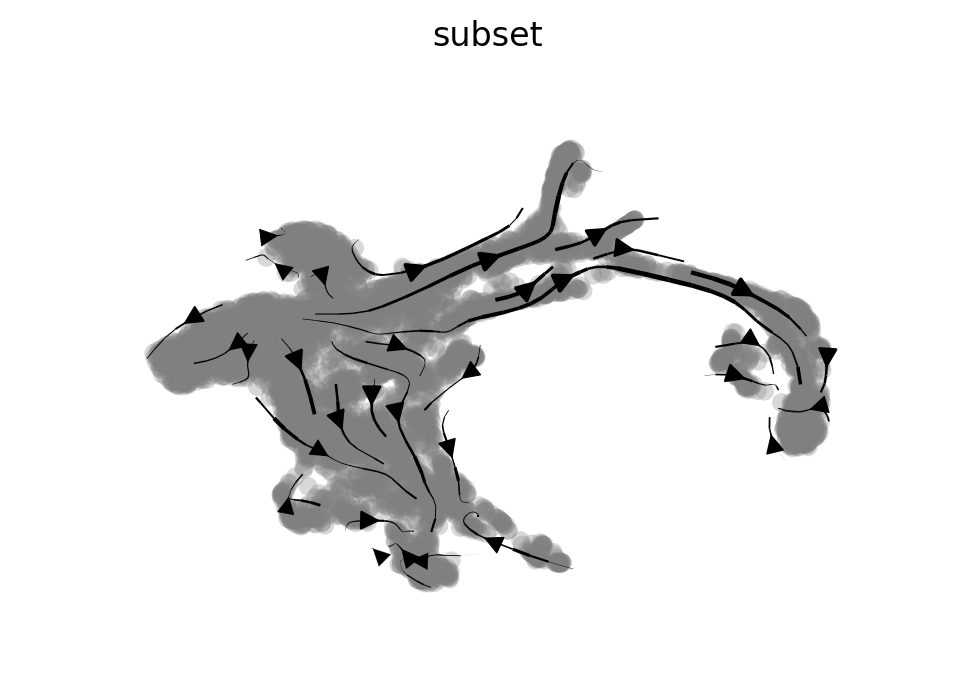

In [66]:
scv.pl.velocity_embedding_stream(
    adata_raw,
    basis="umap",
    #arrow_length=2,
    #density=1,
    title="subset",
    arrow_size=1.5,
    #color="leiden",
    #palette=glasbey_clean_24,
    add_margin=0.2,
    density=.85)

saving figure to file /blue/square.t/peter.huynh/outs/scvelo_output/scvelo_plus345_2_subset_velocity_stream_grey.svg


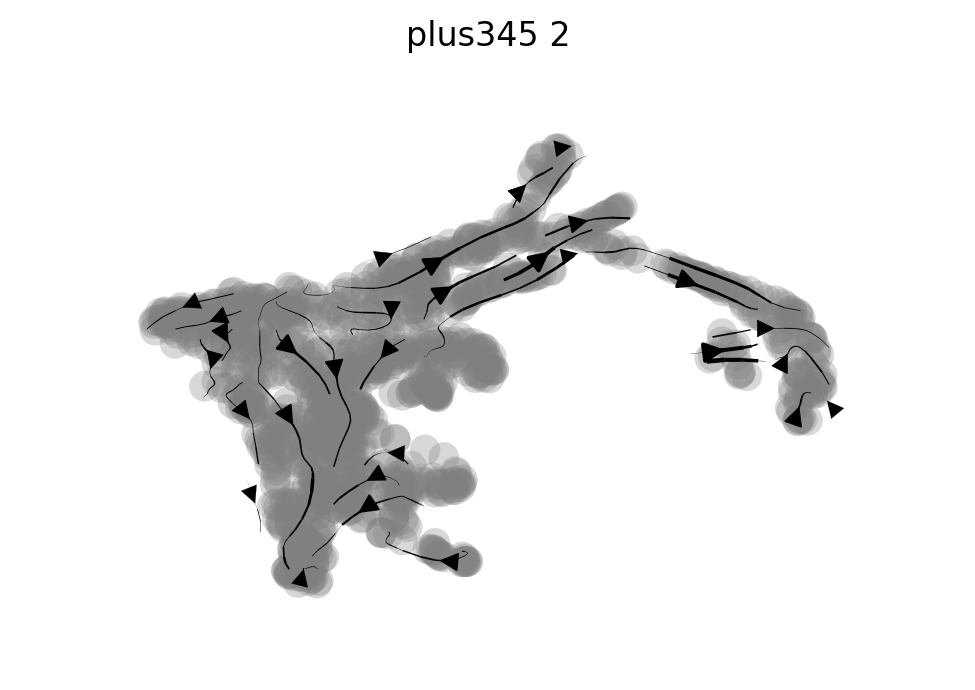

In [214]:
adata_sample = adata_raw[adata_raw.obs["sample"] == "plus345_2"].copy()

scv.pl.velocity_embedding_stream(
    adata_sample,
    basis="umap",
    #arrow_length=2,
    density=.85,
    title="plus345_2",
    arrow_size=1.5,
    #color="leiden",
    #palette=glasbey_clean_24,
    add_margin=0.2,
    save="plus345_2_subset_velocity_stream_grey.svg"
)

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c]

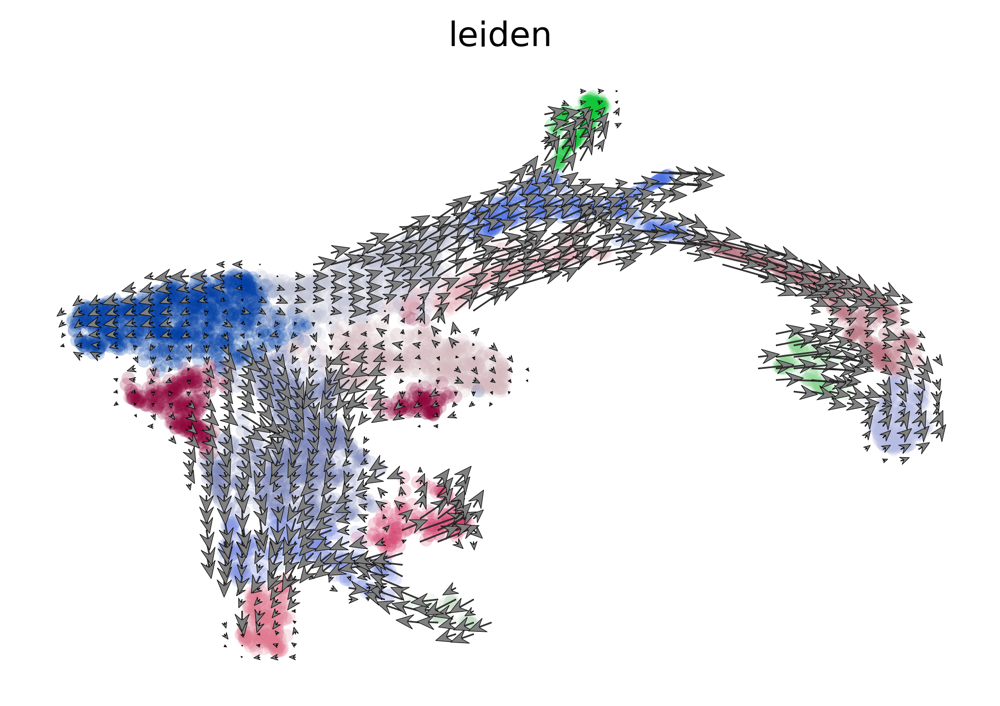

/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c]

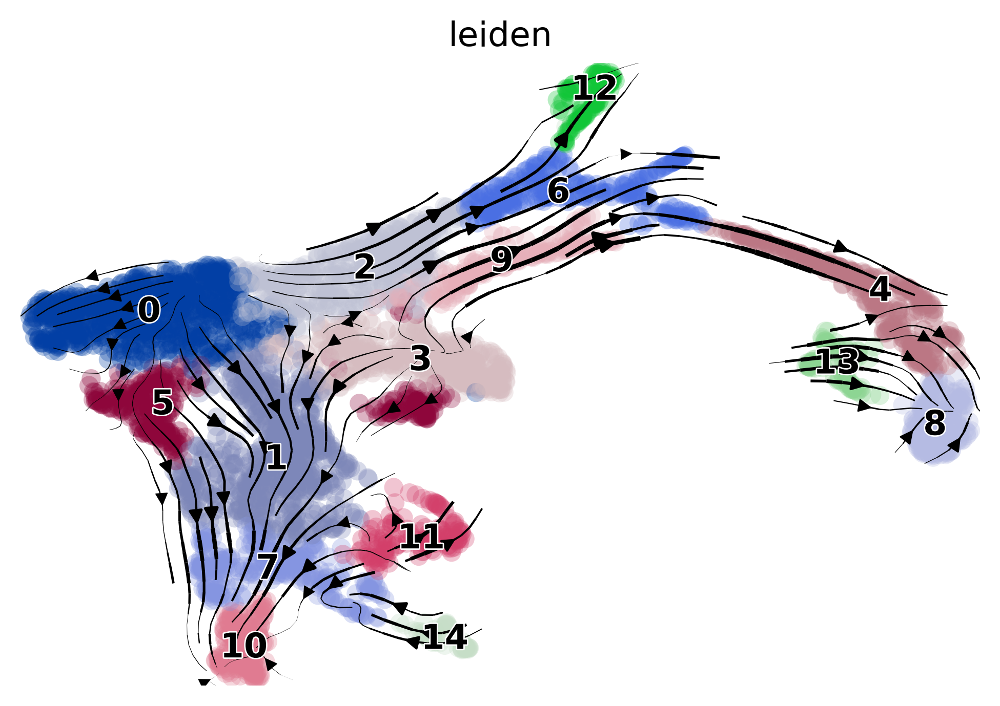

In [146]:
scv.pl.velocity_embedding_grid(
        adata_raw,
        basis="umap",
        arrow_length=3,
    density=1,
        arrow_size=3,dpi=200,color="leiden")
scv.pl.velocity_embedding_stream(adata_raw, basis='umap',dpi=200,color="leiden")

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c]

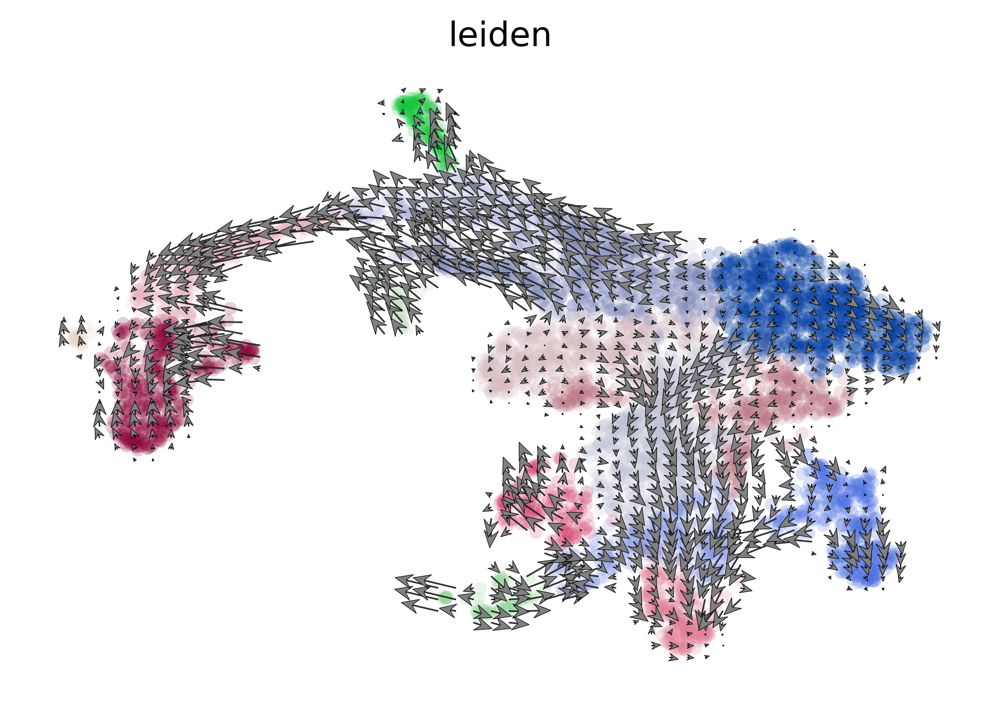

/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/blue/square.t/miniconda3/envs/scvelo033_env_seurat_v3/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c]

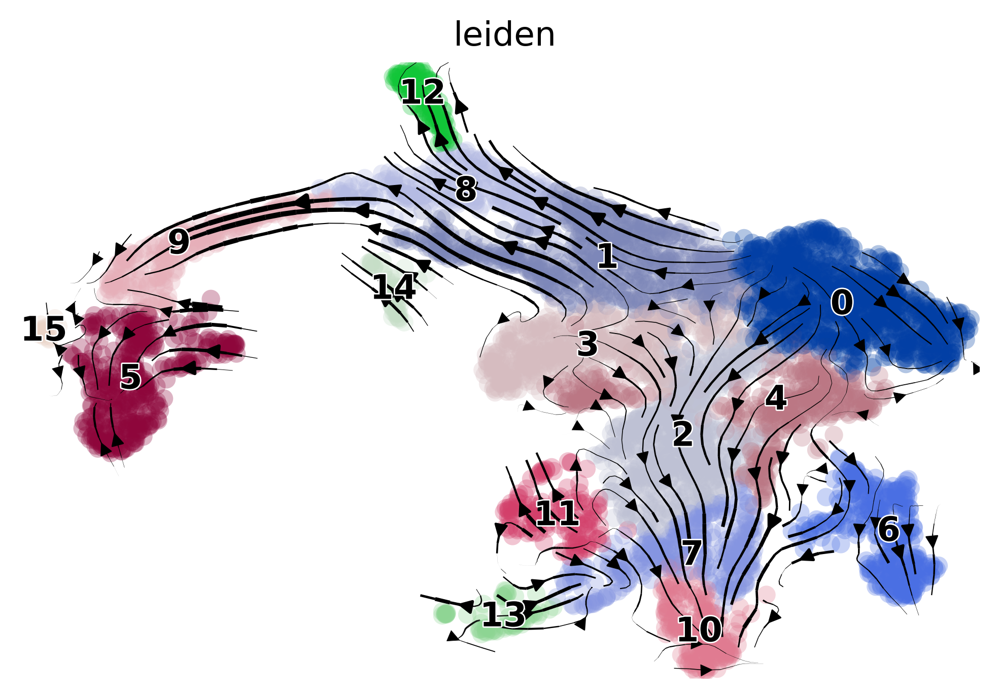

In [49]:
scv.pl.velocity_embedding_grid(
        adata_raw,
        basis="umap",
        arrow_length=3,
    density=1,
        arrow_size=3,dpi=200,color="leiden")
scv.pl.velocity_embedding_stream(adata_raw, basis='umap',dpi=200,color="leiden")

In [ ]:
adata_copy = m5_adata.concatenate(
    m4_adata,
    p5_1_adata,
    p5_2_adata,
    p4_adata,
    batch_key="sample", 
    batch_categories=["minus345", "minus4", "plus345_1", "plus345_2", "plus4"]
)